In [1]:
!git clone https://github.com/phanijonnalagadda2000-art/Track

fatal: destination path 'Track' already exists and is not an empty directory.


In [2]:
ls Track

 Volume in drive C is Windows
 Volume Serial Number is 8E12-F0FC

 Directory of C:\Autonomes Fahren\Codes\04_behavioral_cloning\Track

04-05-2026  15:10    <DIR>          .
05-05-2026  09:10    <DIR>          ..
04-05-2026  15:03         2,885,473 driving_log.csv
04-05-2026  15:10    <DIR>          IMG
               1 File(s)      2,885,473 bytes
               3 Dir(s)  192,106,700,800 bytes free


In [3]:
import tensorflow as tf

# 1. Clear any previous session (Important!)
tf.keras.backend.clear_session()

gpus = tf.config.list_physical_devices('GPU')

if gpus:
    try:
        # Switch from index 1 to 0
        tf.config.set_visible_devices(gpus[0], 'GPU')
        
        # This part helps prevent TF from hogging ALL VRAM at once
        for gpu in gpus:
            try:
                tf.config.experimental.set_memory_growth(gpu, True)
            except:
                pass

        logical_gpus = tf.config.list_logical_devices('GPU')
        print(f"✅ Now active: {logical_gpus}")
    except Exception as e:
        print(f"Error: {e}")

✅ Now active: [LogicalDevice(name='/device:GPU:0', device_type='GPU')]


In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import random
import os
import ntpath

In [17]:
datadir=r'driving_data\3. New laps'
columns=['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names=columns)
pd.set_option('display.max_colwidth', None)
data.tail()

,center,left,right,steering,throttle,reverse,speed
9165,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\center_2026_05_05_09_18_14_520.jpg,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\left_2026_05_05_09_18_14_520.jpg,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\right_2026_05_05_09_18_14_520.jpg,0.0,0.0,0.0,25.03197
9166,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\center_2026_05_05_09_18_14_625.jpg,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\left_2026_05_05_09_18_14_625.jpg,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\right_2026_05_05_09_18_14_625.jpg,0.0,0.0,0.0,24.78020
9167,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\center_2026_05_05_09_18_14_729.jpg,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\left_2026_05_05_09_18_14_729.jpg,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\right_2026_05_05_09_18_14_729.jpg,0.0,0.0,0.0,24.53115
9168,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\center_2026_05_05_09_18_14_839.jpg,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\left_2026_05_05_09_18_14_839.jpg,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\right_2026_05_05_09_18_14_839.jpg,0.0,0.0,0.0,24.23591
9169,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\center_2026_05_05_09_18_14_948.jpg,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\left_2026_05_05_09_18_14_948.jpg,C:\Autonomes Fahren\Codes\04_behavioral_cloning\driving_data\3. New laps\IMG\right_2026_05_05_09_18_14_948.jpg,0.0,0.0,0.0,23.99251


In [19]:
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)

data.tail()

,center,left,right,steering,throttle,reverse,speed
9165,center_2026_05_05_09_18_14_520.jpg,left_2026_05_05_09_18_14_520.jpg,right_2026_05_05_09_18_14_520.jpg,0.0,0.0,0.0,25.03197
9166,center_2026_05_05_09_18_14_625.jpg,left_2026_05_05_09_18_14_625.jpg,right_2026_05_05_09_18_14_625.jpg,0.0,0.0,0.0,24.78020
9167,center_2026_05_05_09_18_14_729.jpg,left_2026_05_05_09_18_14_729.jpg,right_2026_05_05_09_18_14_729.jpg,0.0,0.0,0.0,24.53115
9168,center_2026_05_05_09_18_14_839.jpg,left_2026_05_05_09_18_14_839.jpg,right_2026_05_05_09_18_14_839.jpg,0.0,0.0,0.0,24.23591
9169,center_2026_05_05_09_18_14_948.jpg,left_2026_05_05_09_18_14_948.jpg,right_2026_05_05_09_18_14_948.jpg,0.0,0.0,0.0,23.99251


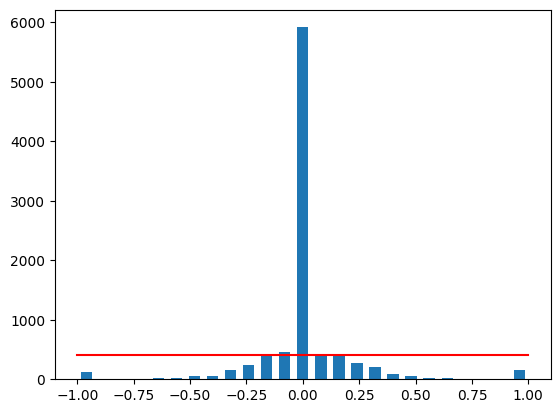

In [21]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5  # This is done to center the data around 0
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin), color='r')

total data: 9170
removed: 5614
remaining: 3556


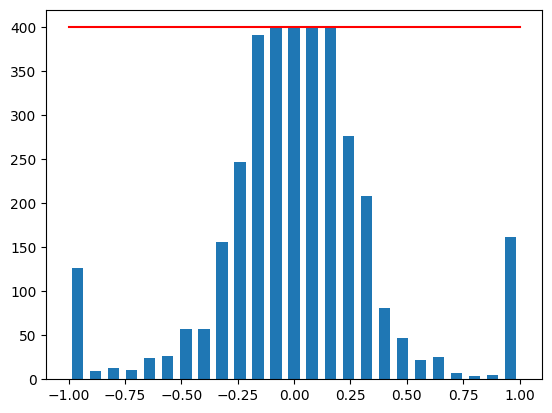

In [23]:
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin), color='r')

In [25]:
print(data.iloc[1])
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(df)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data.iloc[0], indexed_data.iloc[1], indexed_data.iloc[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data.iloc[3]))
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2026_05_04_22_05_59_970.jpg
left          left_2026_05_04_22_05_59_970.jpg
right        right_2026_05_04_22_05_59_970.jpg
steering                             -0.273444
throttle                              0.981758
reverse                                    0.0
speed                                 1.935699
Name: 12, dtype: object


In [27]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training samples:, {} \nValid samples: {}'.format(len(X_train), len(X_valid)))

Training samples:, 2844 
Valid samples: 712


Text(0.5, 1.0, 'Validation set')

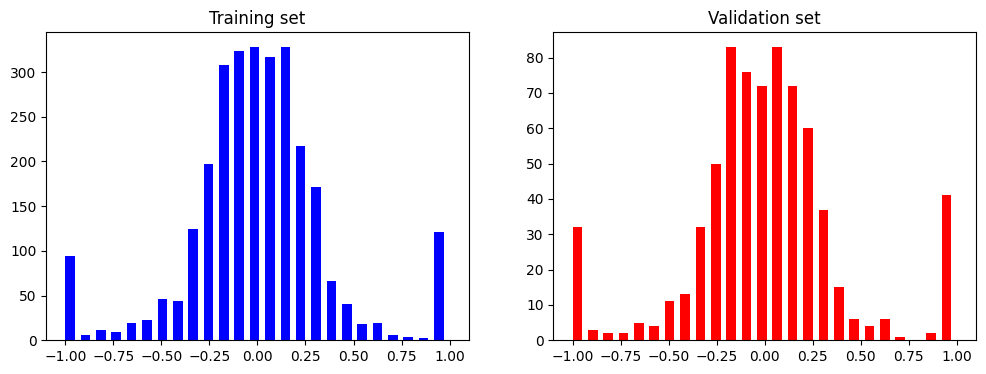

In [29]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
axs[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axs[0].set_title('Training set')
axs[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axs[1].set_title('Validation set')

In [31]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image

Text(0.5, 1.0, 'Zoomed image')

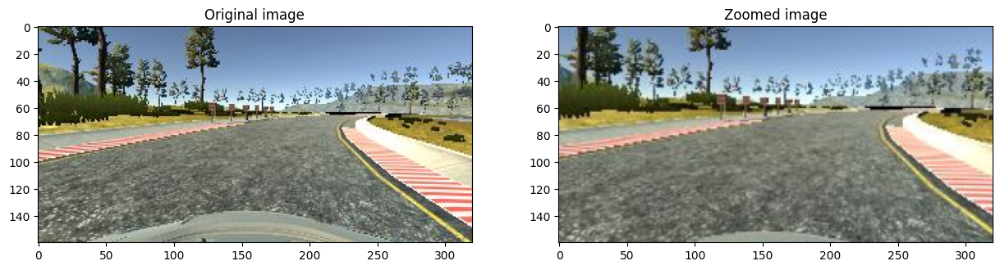

In [33]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoom_image = zoom(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(original_image)
axs[0].set_title('Original image')
axs[1].imshow(zoom_image)
axs[1].set_title('Zoomed image')

In [35]:
def pan(image):
    pan = iaa.Affine(translate_percent={'x':(-0.1, 0.1), 'y':(-0.1, 0.1)})
    image = pan.augment_image(image)
    return image

Text(0.5, 1.0, 'Panned image')

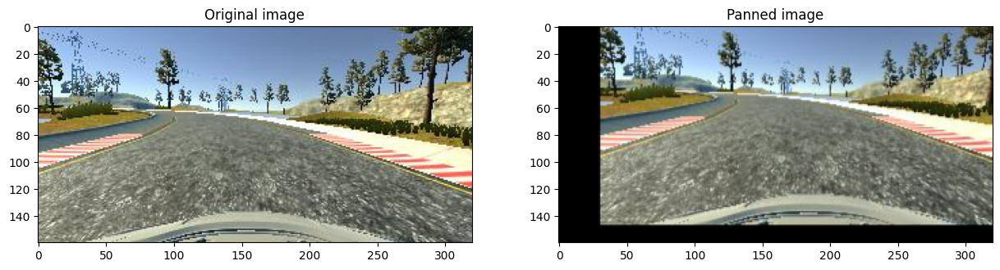

In [37]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(original_image)
axs[0].set_title('Original image')
axs[1].imshow(panned_image)
axs[1].set_title('Panned image')

In [39]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

Text(0.5, 1.0, 'brightness_altered_image')

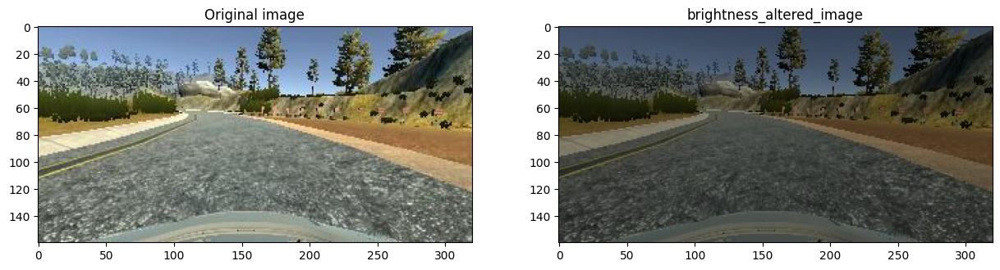

In [41]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(original_image)
axs[0].set_title('Original image')
axs[1].imshow(brightness_altered_image)
axs[1].set_title('brightness_altered_image')

In [43]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1)
    steering_angle = -steering_angle
    return image, steering_angle

Text(0.5, 1.0, 'flipped_image   0.1076199')

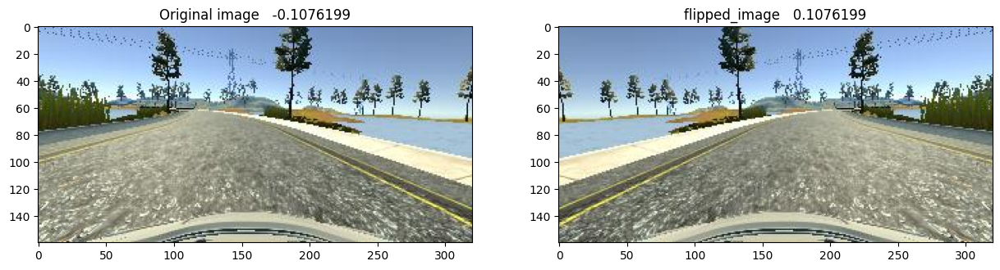

In [45]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(original_image)
axs[0].set_title('Original image   ' + str(steering_angle))
axs[1].imshow(flipped_image)
axs[1].set_title('flipped_image   ' + str(flipped_steering_angle))

In [47]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)
    return image, steering_angle    

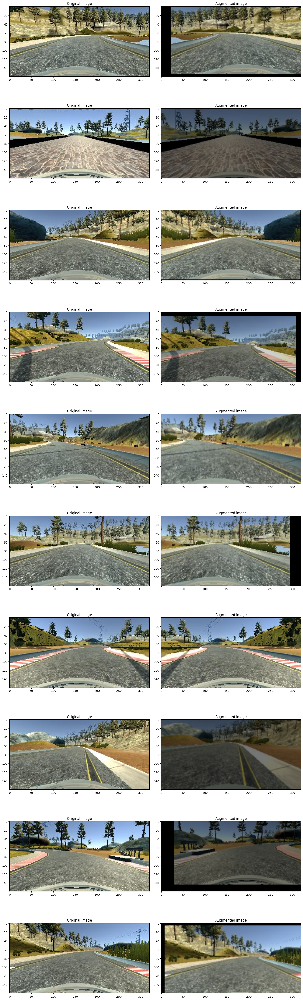

In [49]:
ncol = 2
nrow = 10
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
for i in range(nrow):
    randnum = random.randint(0, len(image_paths) - 1)
    
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]
    
    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)
    axs[i][0].imshow(original_image)
    axs[i][0].set_title('Original image')
    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title('Augmented image')

In [50]:
def img_preprocess(img):
    img = img[60:135, :, :]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed')

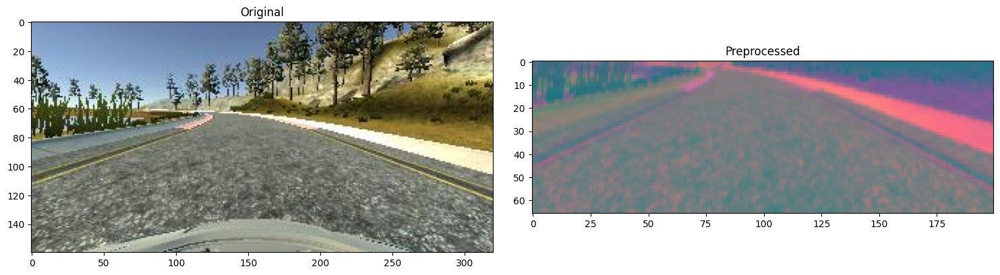

In [51]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original')
axs[1].imshow(preprocessed)
axs[1].set_title('Preprocessed')

In [52]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)
            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]
                
            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

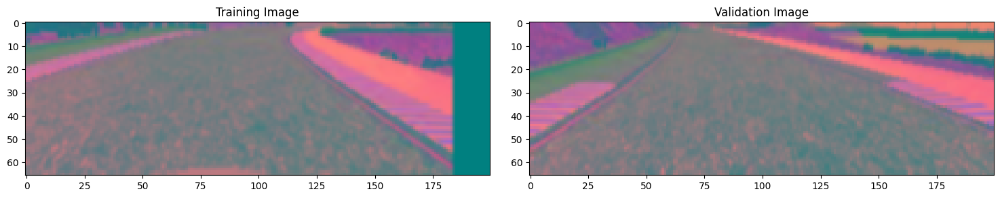

In [53]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [85]:
def nvidia_model():
    model = Sequential()
    model.add(Conv2D(24, (5, 5), strides=(2,2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2,2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2,2), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    
    model.add(Conv2D(64, (3, 3), activation='elu'))
    # model.add(Dropout(0.5))
    
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    # model.add(Dropout(0.5))
    
    model.add(Dense(50, activation='elu'))
    # model.add(Dropout(0.5))
    
    model.add(Dense(10, activation='elu'))
    # model.add(Dropout(0.5))
    
    model.add(Dense(1))

    model.compile(loss='mse', optimizer=Adam(learning_rate=1e-4))
    return model

In [87]:
model = nvidia_model()
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 31, 98, 24)        1824      
                                                                 
 conv2d_11 (Conv2D)          (None, 14, 47, 36)        21636     
                                                                 
 conv2d_12 (Conv2D)          (None, 5, 22, 48)         43248     
                                                                 
 conv2d_13 (Conv2D)          (None, 3, 20, 64)         27712     
                                                                 
 conv2d_14 (Conv2D)          (None, 1, 18, 64)         36928     
                                                                 
 flatten_2 (Flatten)         (None, 1152)              0         
                                                                 
 dense_8 (Dense)             (None, 100)              

In [89]:
history = model.fit(batch_generator(X_train, y_train, batch_size=100, istraining=1), steps_per_epoch=300, epochs=15, validation_data=batch_generator(X_valid, y_valid, batch_size=100, istraining=0), validation_steps=200, verbose=1, shuffle=1)

Epoch 1/15
300/300 [==============================] - 84s 278ms/step - loss: 0.1069 - val_loss: 0.0847
Epoch 2/15
300/300 [==============================] - 88s 293ms/step - loss: 0.0957 - val_loss: 0.0822
Epoch 3/15
300/300 [==============================] - 87s 292ms/step - loss: 0.0864 - val_loss: 0.0655
Epoch 4/15
300/300 [==============================] - 88s 295ms/step - loss: 0.0793 - val_loss: 0.0661
Epoch 5/15
300/300 [==============================] - 89s 296ms/step - loss: 0.0724 - val_loss: 0.0576
Epoch 6/15
300/300 [==============================] - 88s 295ms/step - loss: 0.0673 - val_loss: 0.0505
Epoch 7/15
300/300 [==============================] - 89s 298ms/step - loss: 0.0608 - val_loss: 0.0452
Epoch 8/15
300/300 [==============================] - 89s 299ms/step - loss: 0.0562 - val_loss: 0.0397
Epoch 9/15
300/300 [==============================] - 90s 299ms/step - loss: 0.0516 - val_loss: 0.0385
Epoch 10/15
300/300 [==============================] - 89s 296ms/step - l

Text(0.5, 0, 'epoch')

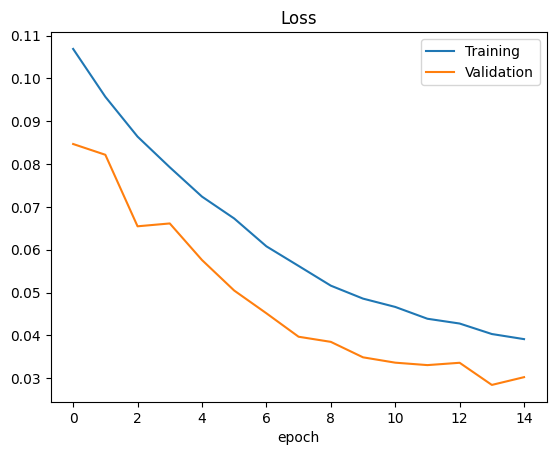

In [90]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Training', 'Validation'])
plt.title('Loss')
plt.xlabel('epoch')

In [91]:
model.save('model.h5')

In [92]:
'''
# To download from Google Colab
from google.colab import files
files.download('model.h5')
'''

"\n# To download from Google Colab\nfrom google.colab import files\nfiles.download('model.h5')\n"

In [93]:
import winsound
import time

def horn_notification():
    # Plays a series of beeps that sound like a car horn (Beep(frequency, duration))
    # Frequency is in Hz, Duration in milliseconds
    for _ in range(5):
        winsound.Beep(440, 500) # 440Hz is roughly an 'A' note
        time.sleep(0.1)

horn_notification()